# 📊 **Restaurant Insights Exploration**

> 🔎 A full-stack data analysis project exploring restaurant trends, ratings, cuisines, and geospatial distribution.


## 📘 Level 1 – Task 1: Data Exploration and  Preprocessing


### 🎯 Objective:
Explore and clean the raw restaurant dataset to prepare it for analysis.

In [18]:
## Import Required Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline


In [19]:
##Load the Dataset
df = pd.read_csv('Dataset .csv')


In [20]:
# View top 5 rows
df.head()


,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


In [21]:
# Check shape
print(f"Rows: {df.shape[0]}, Columns: {df.shape[1]}")


Rows: 9551, Columns: 21


In [22]:
# Summary info
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15  Switch to order menu 

In [24]:
# View summary statistics for numeric columns
df.describe()


,Restaurant ID,Country Code,Longitude,Latitude,Average Cost for two,Price range,Aggregate rating,Votes
count,9.551000e+03,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000
mean,9.051128e+06,18.365616,64.126574,25.854381,1199.210763,1.804837,2.666370,156.909748
std,8.791521e+06,56.750546,41.467058,11.007935,16121.183073,0.905609,1.516378,430.169145
min,5.300000e+01,1.000000,-157.948486,-41.330428,0.000000,1.000000,0.000000,0.000000
25%,3.019625e+05,1.000000,77.081343,28.478713,250.000000,1.000000,2.500000,5.000000
50%,6.004089e+06,1.000000,77.191964,28.570469,400.000000,2.000000,3.200000,31.000000
75%,1.835229e+07,1.000000,77.282006,28.642758,700.000000,2.000000,3.700000,131.000000
max,1.850065e+07,216.000000,174.832089,55.976980,800000.000000,4.000000,4.900000,10934.000000


In [25]:
# Total missing values per column
missing = df.isnull().sum()
missing[missing > 0]


Cuisines    9
dtype: int64

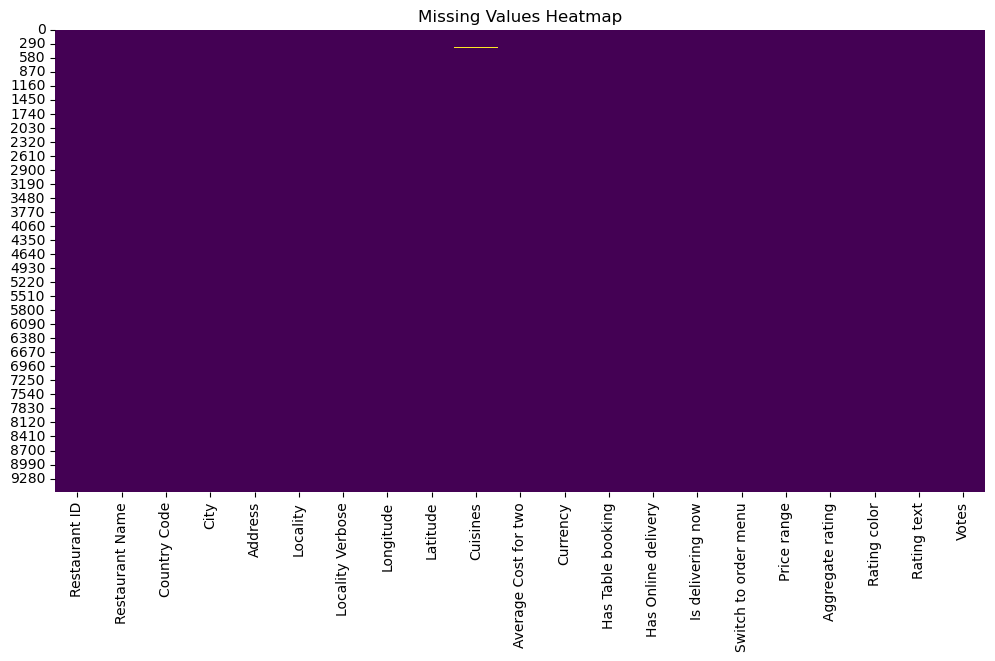

In [26]:
# Visualize missing values
plt.figure(figsize=(12, 6))
sns.heatmap(df.isnull(), cbar=False, cmap='viridis')
plt.title("Missing Values Heatmap")
plt.show()


In [27]:
# Drop rows with missing 'Aggregate rating'
df = df.dropna(subset=['Aggregate rating'])

# Fill missing values in 'Cuisines' column
df['Cuisines'] = df['Cuisines'].fillna('Unknown')


In [14]:
# Convert 'Aggregate rating' to float
df['Aggregate rating'] = pd.to_numeric(df['Aggregate rating'], errors='coerce')

# Convert 'Country Code' to category
df['Country Code'] = df['Country Code'].astype('category')

# Check updated data types
df.dtypes


Restaurant ID              int64
Restaurant Name           object
Country Code            category
City                      object
Address                   object
Locality                  object
Locality Verbose          object
Longitude                float64
Latitude                 float64
Cuisines                  object
Average Cost for two       int64
Currency                  object
Has Table booking         object
Has Online delivery       object
Is delivering now         object
Switch to order menu      object
Price range                int64
Aggregate rating         float64
Rating color              object
Rating text               object
Votes                      int64
dtype: object

In [15]:
# Summary statistics
df['Aggregate rating'].describe()


count    9551.000000
mean        2.666370
std         1.516378
min         0.000000
25%         2.500000
50%         3.200000
75%         3.700000
max         4.900000
Name: Aggregate rating, dtype: float64

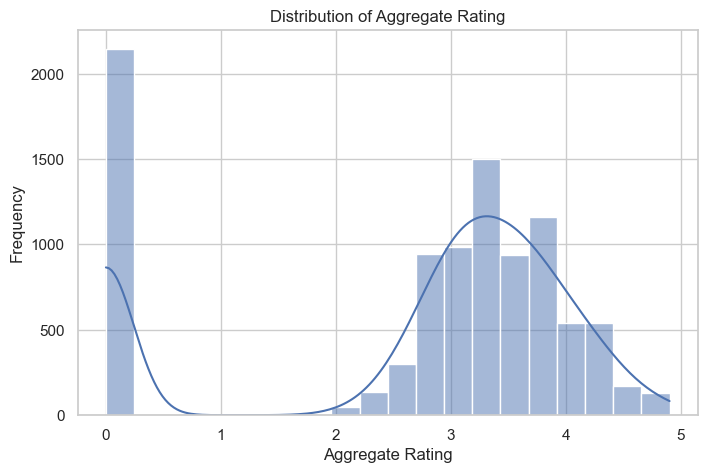

In [16]:
# Histogram of Aggregate Rating
plt.figure(figsize=(8, 5))
sns.histplot(df['Aggregate rating'], bins=20, kde=True)
plt.title('Distribution of Aggregate Rating')
plt.xlabel('Aggregate Rating')
plt.ylabel('Frequency')
plt.show()


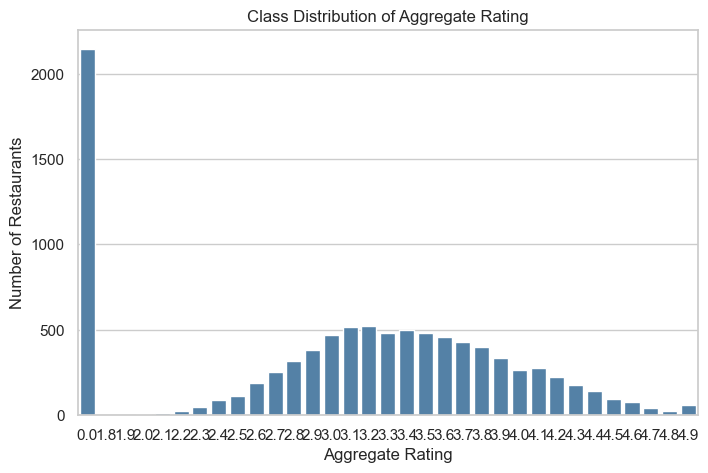

In [18]:
# Frequency of each rating
rating_counts = df['Aggregate rating'].value_counts().sort_index()

# Bar plot
plt.figure(figsize=(8, 5))
sns.barplot(x=rating_counts.index, y=rating_counts.values, color='steelblue')
plt.title("Class Distribution of Aggregate Rating")
plt.xlabel("Aggregate Rating")
plt.ylabel("Number of Restaurants")
plt.show()


In [28]:
# Save preprocessed dataset to new file
df.to_csv("preprocessed_dataset.csv", index=False)


In [32]:
# Confirm Dataset Is Cleaned
df.info()
df.head()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9551 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15  Switch to order menu 

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


## 📊 Task 1 Completed


- 📥 **Loaded** the dataset using `pandas`
- 🔍 **Explored** basic structure with:
  - `df.head()`, `df.shape`, `df.info()`, and `df.describe()`
- 🚫 **Handled missing values**:
  - Dropped rows with missing `Aggregate rating`
  - Filled missing `Cuisines` with `'Unknown'`
- 🔄 **Converted data types**:
  - `Aggregate rating` to float
  - `Country Code` to categorical
- 📊 **Visualized** the distribution of `Aggregate rating` using histograms and bar plots
- 💾 **Saved** the cleaned dataset as `preprocessed_dataset.csv` for use in Task 2

### 📌 Outcome:
A clean and structured dataset ready for descriptive and geospatial analysis.

## 📊 Level 1 – Task 2: Descriptive Analysis


### 🎯 Objective:
Perform descriptive statistical and categorical analysis on the cleaned dataset (`preprocessed_dataset.csv`) from Task 1.



In [33]:
# Import Pandas
import pandas as pd


In [34]:
# Load the cleaned dataset
df = pd.read_csv("preprocessed_dataset.csv")

In [35]:
#  Preview data
df.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


In [3]:
# Mean, std, min, max, and quartiles
df.describe()


,Restaurant ID,Country Code,Longitude,Latitude,Average Cost for two,Price range,Aggregate rating,Votes
count,9.551000e+03,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000
mean,9.051128e+06,18.365616,64.126574,25.854381,1199.210763,1.804837,2.666370,156.909748
std,8.791521e+06,56.750546,41.467058,11.007935,16121.183073,0.905609,1.516378,430.169145
min,5.300000e+01,1.000000,-157.948486,-41.330428,0.000000,1.000000,0.000000,0.000000
25%,3.019625e+05,1.000000,77.081343,28.478713,250.000000,1.000000,2.500000,5.000000
50%,6.004089e+06,1.000000,77.191964,28.570469,400.000000,2.000000,3.200000,31.000000
75%,1.835229e+07,1.000000,77.282006,28.642758,700.000000,2.000000,3.700000,131.000000
max,1.850065e+07,216.000000,174.832089,55.976980,800000.000000,4.000000,4.900000,10934.000000


In [4]:
# Median for numeric columns
df.median(numeric_only=True)


Restaurant ID           6.004089e+06
Country Code            1.000000e+00
Longitude               7.719196e+01
Latitude                2.857047e+01
Average Cost for two    4.000000e+02
Price range             2.000000e+00
Aggregate rating        3.200000e+00
Votes                   3.100000e+01
dtype: float64

In [5]:
# Standard deviation
df.std(numeric_only=True)


Restaurant ID           8.791521e+06
Country Code            5.675055e+01
Longitude               4.146706e+01
Latitude                1.100794e+01
Average Cost for two    1.612118e+04
Price range             9.056088e-01
Aggregate rating        1.516378e+00
Votes                   4.301691e+02
dtype: float64

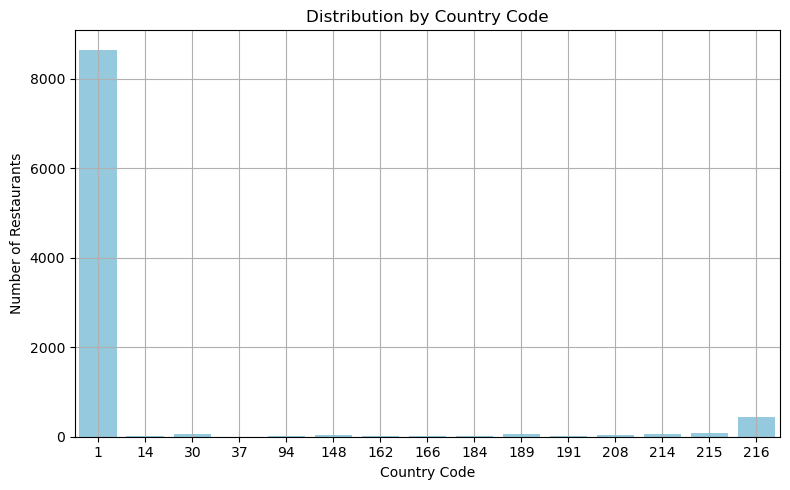

In [36]:
# Distribution of Country Code
import matplotlib.pyplot as plt
import seaborn as sns

country_counts = df['Country Code'].value_counts()

plt.figure(figsize=(8, 5))
sns.barplot(x=country_counts.index, y=country_counts.values, color='skyblue')
plt.title('Distribution by Country Code')
plt.xlabel('Country Code')
plt.ylabel('Number of Restaurants')
plt.grid(True)
plt.tight_layout()
plt.show()


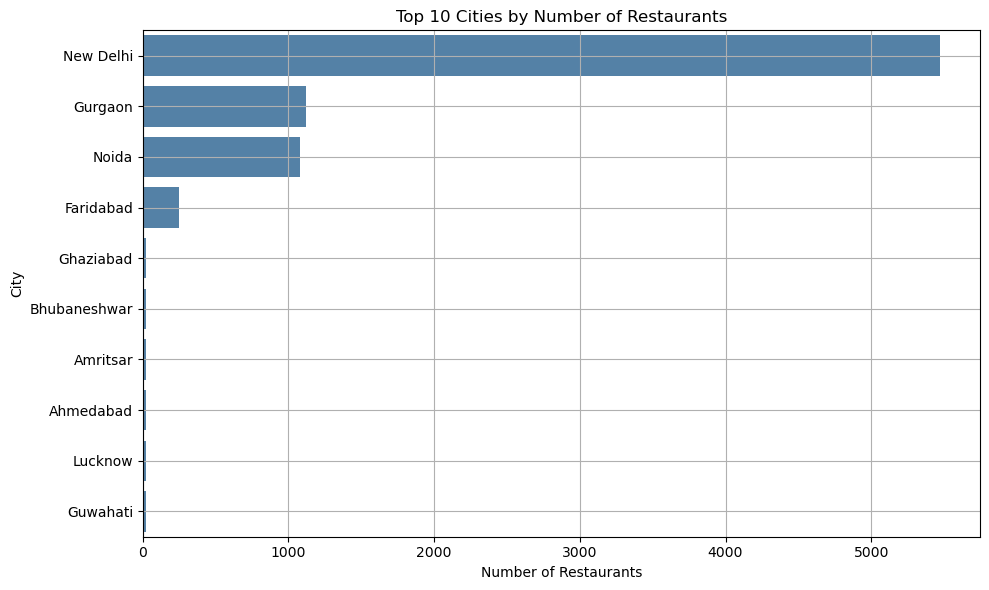

In [40]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Prepare the data
top_cities = df['City'].value_counts().head(10).reset_index()
top_cities.columns = ['City', 'Restaurant Count']

# Plot without palette (to avoid warning)
plt.figure(figsize=(10, 6))
sns.barplot(data=top_cities, x='Restaurant Count', y='City', color='steelblue')  # single color
plt.title('Top 10 Cities by Number of Restaurants')
plt.xlabel('Number of Restaurants')
plt.ylabel('City')
plt.grid(True)
plt.tight_layout()
plt.show()


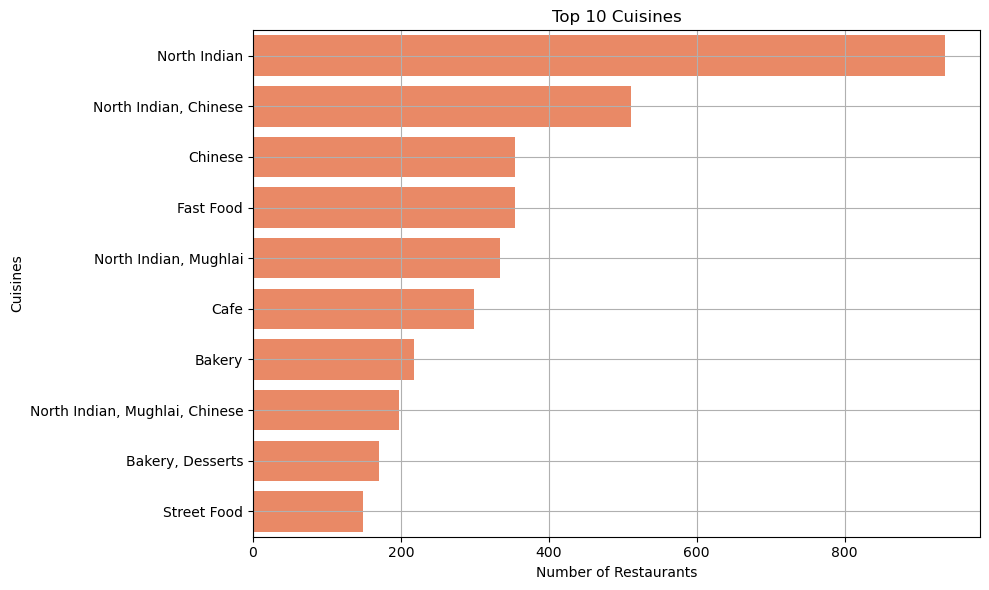

In [11]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Prepare top cuisines DataFrame
top_cuisines = df['Cuisines'].value_counts().head(10).reset_index()
top_cuisines.columns = ['Cuisines', 'Restaurant Count']

# Bar plot without using palette to avoid warning
plt.figure(figsize=(10, 6))
sns.barplot(data=top_cuisines, x='Restaurant Count', y='Cuisines', color='coral')  # use single color
plt.title('Top 10 Cuisines')
plt.xlabel('Number of Restaurants')
plt.ylabel('Cuisines')
plt.grid(True)
plt.tight_layout()
plt.show()


In [41]:
# Save Plots
plt.savefig("top_cuisines.png")


<Figure size 640x480 with 0 Axes>

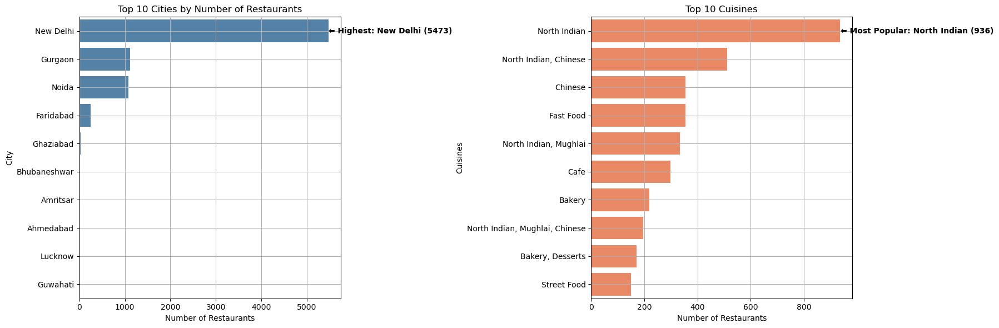

In [42]:
# Annotations for Highest City and Cuisine

#  Import required libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

#  Load the cleaned dataset
df = pd.read_csv("preprocessed_dataset.csv")  # Make sure this file exists in your directory

#  Prepare Top 10 Cities data
top_cities = df['City'].value_counts().head(10).reset_index()
top_cities.columns = ['City', 'Restaurant Count']

# Prepare Top 10 Cuisines data
top_cuisines = df['Cuisines'].value_counts().head(10).reset_index()
top_cuisines.columns = ['Cuisines', 'Restaurant Count']

# Create side-by-side subplots
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# Plot Top Cities
sns.barplot(data=top_cities, x='Restaurant Count', y='City', ax=axes[0], color='steelblue')
axes[0].set_title('Top 10 Cities by Number of Restaurants')
axes[0].set_xlabel('Number of Restaurants')
axes[0].set_ylabel('City')
axes[0].grid(True)

# Annotate highest city
max_city_row = top_cities.iloc[0]
axes[0].text(
    x=max_city_row['Restaurant Count'] + 2,
    y=0,
    s=f"⬅ Highest: {max_city_row['City']} ({max_city_row['Restaurant Count']})",
    va='center',
    color='black',
    weight='bold'
)

# Plot Top Cuisines
sns.barplot(data=top_cuisines, x='Restaurant Count', y='Cuisines', ax=axes[1], color='coral')
axes[1].set_title('Top 10 Cuisines')
axes[1].set_xlabel('Number of Restaurants')
axes[1].set_ylabel('Cuisines')
axes[1].grid(True)

# Annotate highest cuisine
max_cuisine_row = top_cuisines.iloc[0]
axes[1].text(
    x=max_cuisine_row['Restaurant Count'] + 2,
    y=0,
    s=f"⬅ Most Popular: {max_cuisine_row['Cuisines']} ({max_cuisine_row['Restaurant Count']})",
    va='center',
    color='black',
    weight='bold'
)

#  Final layout and display
plt.tight_layout()
plt.savefig("top_cities_and_cuisines_annotated.png")
plt.show()


## 📊 Task 2 Completed
- 📥 **Loaded** the cleaned dataset
- 📏 **Described** numerical columns using:
  - `df.describe()` for mean, std, min, max
  - `df.median()` and `df.std()` for additional stats
- 🌍 **Analyzed categorical distributions**:
  - `Country Code` — number of restaurants per country
  - `City` — top 10 cities by restaurant count
  - `Cuisines` — top 10 most popular cuisines
- 📊 **Created visualizations** using `seaborn` and `matplotlib`


### 📌 Outcomes:
- Clear understanding of the structure and trends in the dataset
- Identified most represented countries, cities, and cuisines
- Data now ready for geospatial and advanced analysis in Task 3

## 🗺️ Level 1 – Task 3: Geospatial Analysis




### 🎯 Objective:
Visualize restaurant locations on a map using latitude and longitude.

Analyze distribution of restaurants across cities or countries.

Determine correlation between location and ratings.

In [5]:
!pip install folium


In [7]:
import folium
from folium.plugins import MarkerCluster


In [43]:
# Load Preprocessed Dataset
df = pd.read_csv("preprocessed_dataset.csv")
df.head()


,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


In [44]:
# Check for Latitude & Longitude
df[['Latitude', 'Longitude']].info()
df[['Latitude', 'Longitude']].describe()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Latitude   9551 non-null   float64
 1   Longitude  9551 non-null   float64
dtypes: float64(2)
memory usage: 149.4 KB


,Latitude,Longitude
count,9551.000000,9551.000000
mean,25.854381,64.126574
std,11.007935,41.467058
min,-41.330428,-157.948486
25%,28.478713,77.081343
50%,28.570469,77.191964
75%,28.642758,77.282006
max,55.976980,174.832089


In [45]:
# Create a Map of All Restaurants

# Center the map around the average lat/lon
map_center = [df['Latitude'].mean(), df['Longitude'].mean()]
map_all = folium.Map(location=map_center, zoom_start=2)

# Clustered map markers
marker_cluster = MarkerCluster().add_to(map_all)

# Add restaurants to map
for idx, row in df.iterrows():
    if pd.notnull(row['Latitude']) and pd.notnull(row['Longitude']):
        folium.Marker(
            location=[row['Latitude'], row['Longitude']],
            popup=f"{row['Restaurant Name']} - Rating: {row['Aggregate rating']}",
        ).add_to(marker_cluster)

map_all


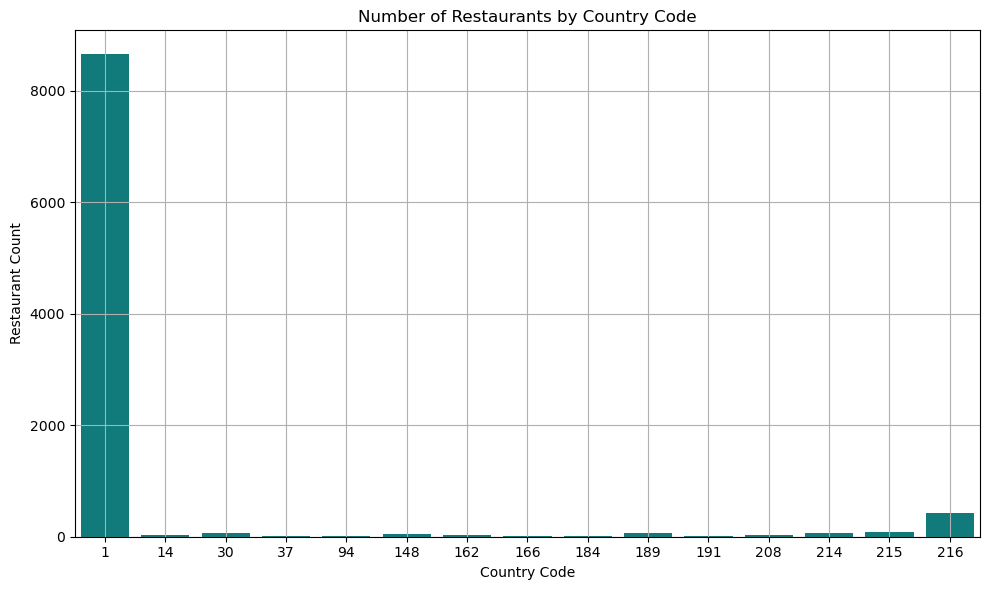

In [11]:
#  Distribution of Restaurants by Country
country_counts = df['Country Code'].value_counts().reset_index()
country_counts.columns = ['Country Code', 'Number of Restaurants']

plt.figure(figsize=(10, 6))
sns.barplot(data=country_counts, x='Country Code', y='Number of Restaurants', color='darkcyan')
plt.title("Number of Restaurants by Country Code")
plt.xlabel("Country Code")
plt.ylabel("Restaurant Count")
plt.grid(True)
plt.tight_layout()
plt.show()


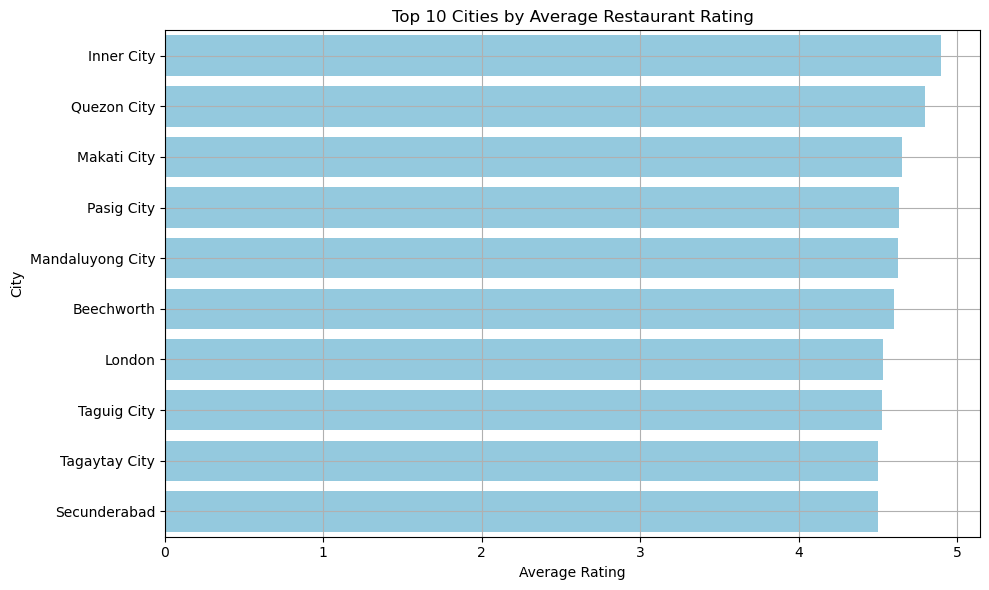

In [14]:
# Correlation Between Location and Rating 
plt.figure(figsize=(10, 6))
sns.barplot(data=city_rating, x='Aggregate rating', y='City', color='skyblue')
plt.title("Top 10 Cities by Average Restaurant Rating")
plt.xlabel("Average Rating")
plt.ylabel("City")
plt.grid(True)
plt.tight_layout()
plt.show()


In [48]:
from IPython.display import HTML

# Display link to open in browser
HTML('<a href="restaurant_locations_map.html" target="_blank">🌍 Click here to open the interactive restaurant map</a>')


## ✅ Task 3: Geospatial Analysis Completed


- **Loaded** the cleaned dataset from Task 1 (`preprocessed_dataset.csv`)
- **Checked** availability of `Latitude` and `Longitude` data
- **Created an interactive map** using `folium` and `MarkerCluster` to plot restaurant locations globally
- **Analyzed distribution** of restaurants by `Country Code` using a bar plot
- **Visualized correlation** between city and rating by plotting average `Aggregate rating` across top cities


### 📌 Outcomes:
- Interactive map of restaurant locations (`folium`)
- Country-level distribution insights
- Top cities based on average customer ratings